# Описание проекта

Вы работаете в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).   

Ваши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. 

Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.  

Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. 
На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.  

**Юридические ограничения**

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.  
В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:  

⎢ This image is unavailable in your country in compliance with local laws.  

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

**Описание данных**

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- Доля людей, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- 3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
import re
from PIL import Image
from pathlib import Path
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from tqdm import tqdm
from transformers import BertTokenizer, BertModel
import torch
import numpy as np

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import  StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, Input, BatchNormalization, Flatten
from tensorflow.keras.callbacks import EarlyStopping


import warnings
warnings.filterwarnings('ignore')

In [2]:
RANDOM_STATE = 2033

Загрузим данные и Посмотрим на них.

In [3]:
PATH = r"C:\Users\SquareWord\Desktop\Projects\pr\to_upload"

In [4]:
CrowdAnnotations = pd.read_csv(PATH + '\\CrowdAnnotations.tsv',sep='\t', 
                                names=['image', 'query_id', 'correct_proportion', 'correct_number', 'wrong_number'])

ExpertAnnotations = pd.read_csv(PATH + '\\ExpertAnnotations.tsv',sep='\t', 
                               names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])

df_train = pd.read_csv(PATH +'\\train_dataset.csv')
df_test_qu = pd.read_csv(PATH + '\\test_queries.csv', index_col=[0], sep='|')
df_test_im = pd.read_csv(PATH +'\\test_images.csv')

In [5]:
def get_info(df):
    display(df.info())
    display(df.sample(5))
    print('\nНайдено пропусков:')
    print(df.isna().sum())
    print('\nНайдено дубликатов:', df.duplicated().sum())

In [6]:
get_info(CrowdAnnotations)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               47830 non-null  object 
 1   query_id            47830 non-null  object 
 2   correct_proportion  47830 non-null  float64
 3   correct_number      47830 non-null  int64  
 4   wrong_number        47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

,image,query_id,correct_proportion,correct_number,wrong_number
19375,2876993733_cb26107d18.jpg,3610683688_bbe6d725ed.jpg#2,0.000000,0,3
14862,2595186208_9b16fa0ee3.jpg,3375991133_87d7c40925.jpg#2,0.000000,0,3
4942,1962729184_6996e128e7.jpg,2189995738_352607a63b.jpg#2,0.000000,0,3
23715,3064383768_f6838f57da.jpg,3064383768_f6838f57da.jpg#2,0.333333,1,2
8125,2238019823_79318d1f11.jpg,3064383768_f6838f57da.jpg#2,1.000000,3,0



Найдено пропусков:
image                 0
query_id              0
correct_proportion    0
correct_number        0
wrong_number          0
dtype: int64

Найдено дубликатов: 0


In [7]:
get_info(ExpertAnnotations)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


None

,image,query_id,expert_1,expert_2,expert_3
2398,2884301336_dc8e974431.jpg,3030294889_78b2ccbe51.jpg#2,1,1,2
1776,2577972703_a22c5f2a87.jpg,3627011534_485f667b10.jpg#2,2,3,3
4129,3449114979_6cdc3e8da8.jpg,3498997518_c2b16f0a0e.jpg#2,1,1,1
2275,2842865689_e37256d9ce.jpg,2985679744_75a7102aab.jpg#2,2,2,2
5343,488356951_b3b77ad832.jpg,3503689049_63212220be.jpg#2,2,2,2



Найдено пропусков:
image       0
query_id    0
expert_1    0
expert_2    0
expert_3    0
dtype: int64

Найдено дубликатов: 0


In [8]:
get_info(df_train)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

,image,query_id,query_text
4836,3767841911_6678052eb6.jpg,3232470286_903a61ea16.jpg#2,A soccer player tries to kick the ball in the ...
2440,2541104331_a2d65cfa54.jpg,3217266166_4e0091860b.jpg#2,Two small children are twirling sparkling rope .
5257,2616643090_4f2d2d1a44.jpg,2909875716_25c8652614.jpg#2,A woman in a field enjoys her clothing being b...
4579,523985664_c866af4850.jpg,2843695880_eeea6c67db.jpg#2,Two people in water .
5234,260520547_944f9f4c91.jpg,3458211052_bb73084398.jpg#2,A line of people staring at the vehicles on th...



Найдено пропусков:
image         0
query_id      0
query_text    0
dtype: int64

Найдено дубликатов: 0


In [9]:
get_info(df_test_qu)

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


None

,query_id,query_text,image
247,3154152744_4e93ec8a62.jpg#2,Two dogs are chewing at a red object whilst ru...,3154152744_4e93ec8a62.jpg
396,3555573680_41c1540a86.jpg#1,A man is doing a jump on a wakeboard in the wa...,3555573680_41c1540a86.jpg
103,2428094795_d3a8f46046.jpg#3,A young girl in blue hat and coat is riding a ...,2428094795_d3a8f46046.jpg
349,345785626_9fa59f38ce.jpg#4,Seated man looks out at the ocean .,345785626_9fa59f38ce.jpg
379,3514297698_0512623955.jpg#4,A spotted dog stands on his hind legs to catch...,3514297698_0512623955.jpg



Найдено пропусков:
query_id      0
query_text    0
image         0
dtype: int64

Найдено дубликатов: 0


In [10]:
get_info(df_test_im)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


None

,image
39,381514859_b40418d9c3.jpg
97,3091962081_194f2f3bd4.jpg
67,3482859574_3908de3427.jpg
75,3601978895_9fec23ce0c.jpg
72,269650644_059a84ece5.jpg



Найдено пропусков:
image    0
dtype: int64

Найдено дубликатов: 0


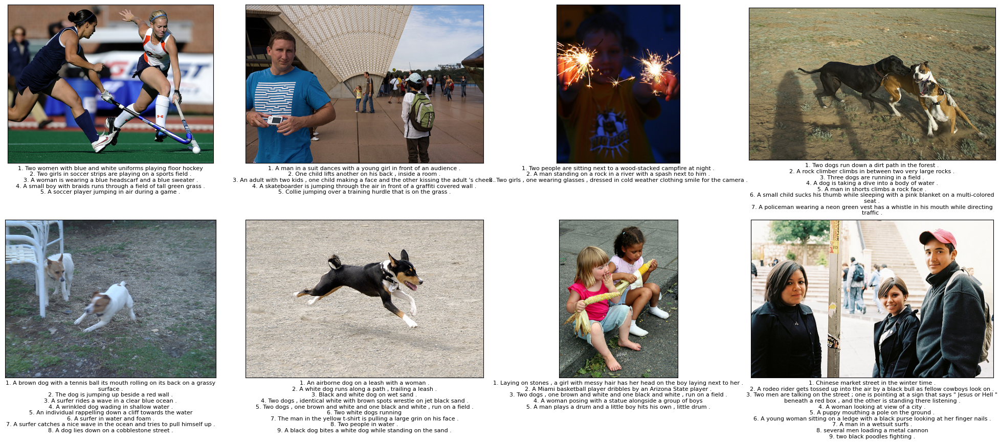

In [11]:
# Группировка описаний по изображениям
image_to_descriptions = df_train.groupby('image')['query_text'].apply(list).reset_index()

# Выбор случайных изображений для отображения
samples_train = image_to_descriptions.sample(8)

# Отображение изображений с описаниями
fig = plt.figure(figsize=(20, 16))
for i, (image_name, descriptions) in enumerate(zip(samples_train['image'], samples_train['query_text'])):
    # Загрузка изображения
    image_path = Path(PATH, 'train_images', image_name)
    try:
        image = Image.open(image_path)
    except FileNotFoundError:
        print(f"Изображение {image_name} не найдено. Пропускаем.")
        continue
    
    # Добавление подграфика
    ax = fig.add_subplot(4, 4, i+1)
    ax.imshow(image)
    
    # Добавление описаний
    desc_text = "\n".join([f"{j+1}. {desc}" for j, desc in enumerate(descriptions)])
    ax.set_xlabel(desc_text, fontsize=8, wrap=True)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

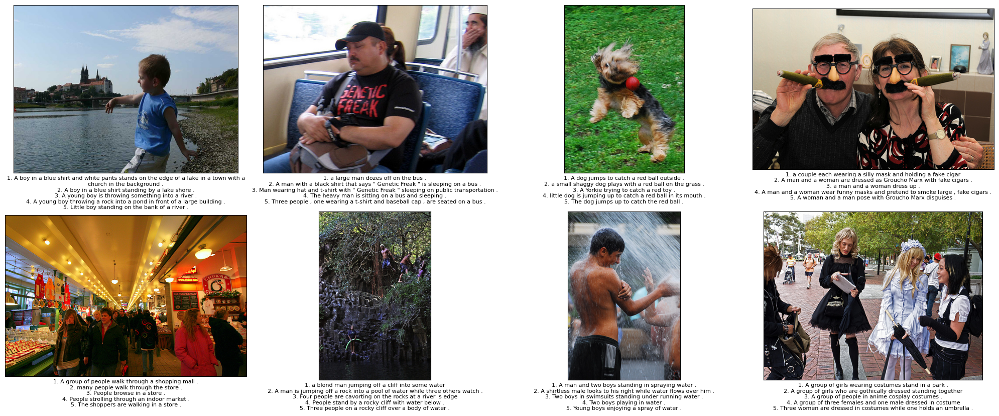

In [12]:
image_to_descriptions = df_test_qu.groupby('image')['query_text'].apply(list).reset_index()

samples_train = image_to_descriptions.sample(8)


fig = plt.figure(figsize=(20, 16))
for i, (image_name, descriptions) in enumerate(zip(samples_train['image'], samples_train['query_text'])):
    image_path = Path(PATH, 'test_images', image_name)
    try:
        image = Image.open(image_path)
    except FileNotFoundError:
        print(f"Изображение {image_name} не найдено. Пропускаем.")
        continue
    
    ax = fig.add_subplot(4, 4, i+1)
    ax.imshow(image)
    
    desc_text = "\n".join([f"{j+1}. {desc}" for j, desc in enumerate(descriptions)])
    ax.set_xlabel(desc_text, fontsize=8, wrap=True)  
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

Посмотрим на количество уникальных изображений в обучающей и тестовой выборках.

In [13]:
print('Количество уникальных фото на обучающей выборке:', len(df_train['image'].unique()))
print('Количество уникальных фото на тестовой выборке:', len(df_test_qu['image'].unique()))

Количество уникальных фото на обучающей выборке: 1000
Количество уникальных фото на тестовой выборке: 100


**Выводы**:
- Мы загрузили и ознакомились с данными.
- В нашем распоряжении 1000 картинок на тест и 100 на трейн.
- Все данные, включая тестовые наборы, заполнены без пропусков и дубликатов.
- В `Crowd Annotations` имеется значительно больше записей, что указывает на большую вариативность в оценках от множества участников.
- Набор `Expert Annotations` содержит больше информации о каждом запросе и изображении, предоставляя более точные аннотации.
- В представленном наборе изображений наблюдается значительное разнообразие сцен и объектов, которые охватывают различные аспекты социальной и индивидуальной активности.

### Аггрегация оценок

Посмотрим на распределение экспертных оценок

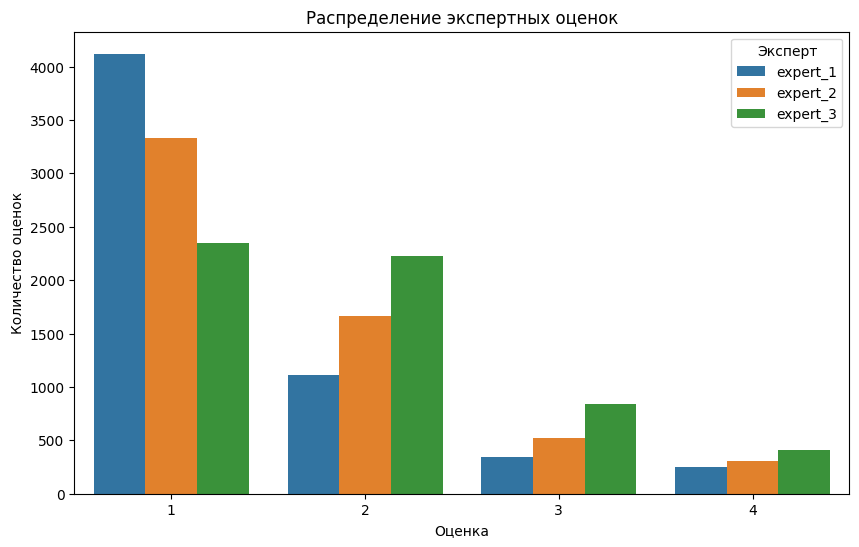

In [14]:
expert_1 = ExpertAnnotations[['expert_1']].rename(columns={'expert_1':'mark'})
expert_1['lable'] = 'expert_1'

expert_2 = ExpertAnnotations[['expert_2']].rename(columns={'expert_2':'mark'})
expert_2['lable'] = 'expert_2'

expert_3 = ExpertAnnotations[['expert_3']].rename(columns={'expert_3':'mark'})
expert_3['lable'] = 'expert_3'

for_plot = pd.concat([expert_1, expert_2, expert_3])

plt.figure(figsize=(10, 6))
sns.countplot(data=for_plot, x='mark', hue='lable')
plt.title('Распределение экспертных оценок')
plt.xlabel('Оценка')
plt.ylabel('Количество оценок')
plt.legend(title='Эксперт')
plt.show();

В целом видно что описания картинок не очень качественные и эксперты ставят довольно низкие оценки
- 1-й эксперт чаще других ставит наименьшую оценку
- 3-й эксперт чаще других ставит оценку "2" и чеще дрйгих положительно оценивает соответствия


Объеденим таблицы

In [15]:
df = pd.merge(left=df_train,
         right=ExpertAnnotations,
         on=['image','query_id'],
         how = "left")
df = pd.merge(left=df,
              right=CrowdAnnotations,
              on=['image','query_id'],
              how='left')

In [16]:
get_info(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               5822 non-null   object 
 1   query_id            5822 non-null   object 
 2   query_text          5822 non-null   object 
 3   expert_1            5822 non-null   int64  
 4   expert_2            5822 non-null   int64  
 5   expert_3            5822 non-null   int64  
 6   correct_proportion  2329 non-null   float64
 7   correct_number      2329 non-null   float64
 8   wrong_number        2329 non-null   float64
dtypes: float64(3), int64(3), object(3)
memory usage: 409.5+ KB


None

,image,query_id,query_text,expert_1,expert_2,expert_3,correct_proportion,correct_number,wrong_number
2407,2229179070_dc8ea8582e.jpg,1467533293_a2656cc000.jpg#2,"Two little girls , both dressed in pink , play...",1,1,1,NaN,NaN,NaN
5667,3168123064_d1983b8f92.jpg,3301859683_2d5e4b40a3.jpg#2,A person skis downhill .,1,2,2,0.000000,0.0,3.0
5183,311146855_0b65fdb169.jpg,3685328542_ab999b83bb.jpg#2,A man in a green and silver Mardi Gras costume...,2,2,3,0.333333,1.0,2.0
1686,3461041826_0e24cdf597.jpg,2878272032_fda05ffac7.jpg#2,dogs playing in a stream,3,3,3,0.666667,2.0,1.0
2997,2078311270_f01c9eaf4c.jpg,3145967309_b33abe4d84.jpg#2,A man in a white print shirt and a woman in a ...,1,1,2,NaN,NaN,NaN



Найдено пропусков:
image                    0
query_id                 0
query_text               0
expert_1                 0
expert_2                 0
expert_3                 0
correct_proportion    3493
correct_number        3493
wrong_number          3493
dtype: int64

Найдено дубликатов: 0


Найдём пары с наибольшими расхождениями между минимальной и максимальной оценками

In [17]:
df['score_range'] = df[['expert_1', 'expert_2', 'expert_3']].max(axis=1) - df[['expert_1', 'expert_2', 'expert_3']].min(axis=1)
difference = df[df['score_range'] > 2]
print(f"Количество строк с большими расхождениями: {len(difference)}")
display(df[df['score_range'] > 2])

Количество строк с большими расхождениями: 3


,image,query_id,query_text,expert_1,expert_2,expert_3,correct_proportion,correct_number,wrong_number,score_range
1387,542179694_e170e9e465.jpg,300577375_26cc2773a1.jpg#2,An officer stands next to a car on a city stre...,1,2,4,NaN,NaN,NaN,3
5171,3388330419_85d72f7cda.jpg,3358558292_6ab14193ed.jpg#2,The room full of youths reacts emotionally as ...,1,2,4,NaN,NaN,NaN,3
5775,542317719_ed4dd95dc2.jpg,542317719_ed4dd95dc2.jpg#2,A smiling child slides down a slippery tube slide,1,4,4,0.666667,2.0,1.0,3


Удаляем записи где эксперты не сошлись во мнении

In [18]:
df = df[df['score_range'] <= 2]

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5819 entries, 0 to 5821
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               5819 non-null   object 
 1   query_id            5819 non-null   object 
 2   query_text          5819 non-null   object 
 3   expert_1            5819 non-null   int64  
 4   expert_2            5819 non-null   int64  
 5   expert_3            5819 non-null   int64  
 6   correct_proportion  2328 non-null   float64
 7   correct_number      2328 non-null   float64
 8   wrong_number        2328 non-null   float64
 9   score_range         5819 non-null   int64  
dtypes: float64(3), int64(4), object(3)
memory usage: 500.1+ KB


Аггрегируем экспертную оценку усреднением ответов и сведением к диапазону от 0 до 1

In [20]:
df['expert_result'] = (df['expert_1'] + df['expert_2'] + df['expert_3']-3)/3/3

In [21]:
df.head()

,image,query_id,query_text,expert_1,expert_2,expert_3,correct_proportion,correct_number,wrong_number,score_range,expert_result
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0.0,3.0,0,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,NaN,NaN,NaN,0,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.0,0.0,3.0,1,0.222222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,4,4,4,1.0,3.0,0.0,0,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,NaN,NaN,NaN,0,0.000000


Заполним пропуски в `correct_proportion` на оценку экспертов.

In [22]:
df.loc[df['correct_proportion'].isna(), ['correct_proportion']] = df['expert_result']


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5819 entries, 0 to 5821
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               5819 non-null   object 
 1   query_id            5819 non-null   object 
 2   query_text          5819 non-null   object 
 3   expert_1            5819 non-null   int64  
 4   expert_2            5819 non-null   int64  
 5   expert_3            5819 non-null   int64  
 6   correct_proportion  5819 non-null   float64
 7   correct_number      2328 non-null   float64
 8   wrong_number        2328 non-null   float64
 9   score_range         5819 non-null   int64  
 10  expert_result       5819 non-null   float64
dtypes: float64(4), int64(4), object(3)
memory usage: 674.6+ KB


In [24]:
df['result'] = df['expert_result'] * 0.6 + df['correct_proportion'] * 0.4


In [25]:
df.head()

,image,query_id,query_text,expert_1,expert_2,expert_3,correct_proportion,correct_number,wrong_number,score_range,expert_result,result
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,0.0,3.0,0,0.000000,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,NaN,NaN,0,0.000000,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.0,0.0,3.0,1,0.222222,0.133333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,4,4,4,1.0,3.0,0.0,0,1.000000,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.0,NaN,NaN,0,0.000000,0.000000


Удалим лишние столбцы

In [26]:
df = df[['image','query_id', 'query_text', 'result']]

In [27]:
df.head()

,image,query_id,query_text,result
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.133333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


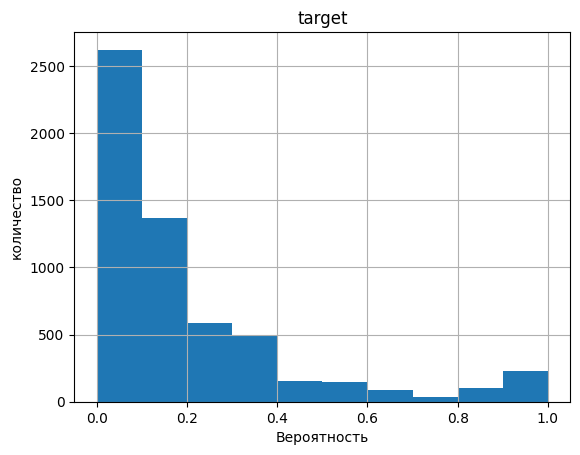

In [28]:
plt.xlabel("Вероятность")
plt.ylabel("количество")
plt.title("target")
df['result'].hist()
plt.show()

Соответствие фотографий описанию запроса как правило низкое.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Cоздадим список слов, потенциально нарушающих законодательство.

In [29]:
BAD_WORDS = {'child', 
             'children',
             'young',
             'baby',
             'babe',
             'babies',
             'boy',
             'boys',
             'girl',
             'girls',
             'kid',
             'kids',
             'kiddy',
             'infant',
             'infants',
             'infancy',
             'toddler',
             'toddlers'}

Очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми. Отметим в обучающем наборе фото подлежащие блокировке.

In [30]:
nlp = spacy.load("en_core_web_sm")

def get_lemmas(text) -> list:
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    doc = nlp(text)
    lemmas = [token.lemma_ for token in doc]
    
    return lemmas

In [31]:
def cleaning(row) -> object:
    text = get_lemmas(row['query_text'])
    if any(word in BAD_WORDS for word in text):
        row['to_block'] = 1
    else:
        row['to_block'] = 0
    
    return row

In [32]:
df = df.apply(cleaning, axis=1)

In [34]:
bad_images = df[df['to_block'] == 1]['query_id'].apply(lambda x: x[:-2]).unique()

Посмотрим сколько и какие фото попали под запрет. 

In [36]:
inappropriate_image = df[df['image'].isin(bad_images)].shape[0]
print(f"Количество изображений, где присутствуют дети: {inappropriate_image}")

Количество изображений, где присутствуют дети: 1806


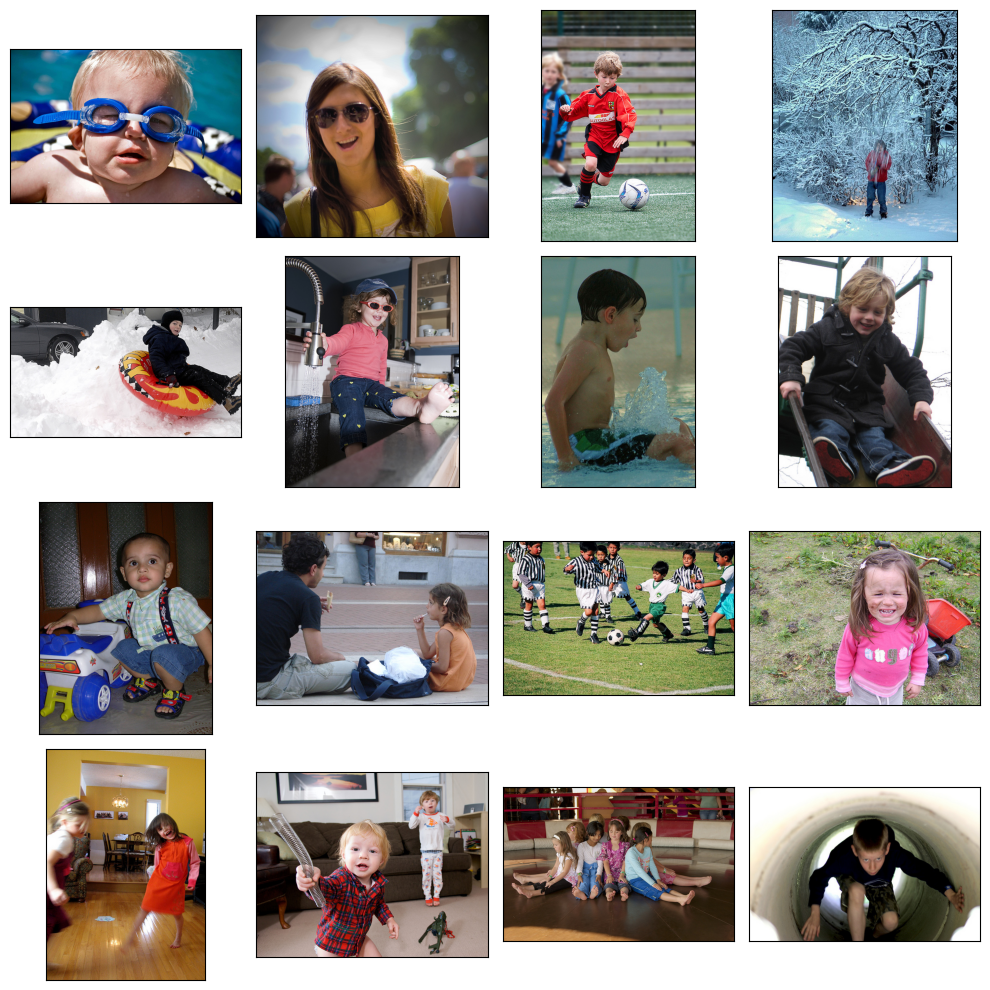

In [38]:
samples = list(bad_images[:16])

fig = plt.figure(figsize=(10, 10))
for i in range(16):
    fig.add_subplot(4, 4, i + 1)
    image_path = Path(PATH, 'train_images', samples[i])
    image = Image.open(image_path)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

plt.show()

Похоже что мы верно отметили фотографии. Удалим фото с детьми из набора данных.

In [ ]:
df = df[~df['image'].isin(bad_images)]
df.drop(columns='to_block', inplace=True, errors='ignore')
df.reset_index(inplace=True, drop=True)

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4013 entries, 0 to 4012
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4013 non-null   object 
 1   query_id    4013 non-null   object 
 2   query_text  4013 non-null   object 
 3   result      4013 non-null   float64
dtypes: float64(1), object(3)
memory usage: 125.5+ KB


### Вывод
- удалили запросы и изображения, которые могут вызвать проблемы с законодательством
- Удалено 1631 изображений
- Размер датасета 4188

## 3. Векторизация изображений

Перейдём к векторизации изображений.

In [41]:
resnet = models.resnet18(pretrained=True)

for param in resnet.parameters():
    param.requires_grad_(False) 
    
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules) 

resnet.eval()  

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [42]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
]) 

In [43]:
def vectorize(data_txt_itog, data_img, data_path):
    output_tensor_train = []
    
    for i in tqdm(data_img):   
        img = Image.open(data_path +i).convert('RGB') 
        image_tensor = preprocess(img)
        if len(output_tensor_train) == 0:
            output_tensor_train = pd.DataFrame(resnet(image_tensor.unsqueeze(0)).flatten()).transpose()
        else:
            output_tensor_train = pd.concat([output_tensor_train, pd.DataFrame(resnet(image_tensor.unsqueeze(0)).flatten()).transpose()])

    output_tensor_train = output_tensor_train.reset_index(drop = True)
    cols = []
    for i in output_tensor_train.columns:
        cols.append('img_'+str(i))
    output_tensor_train.columns = cols

    output_tensor_train = pd.concat([data_txt_itog,output_tensor_train], axis = 1)
    
    return output_tensor_train

In [44]:
output_tensor_train = vectorize(df[['image','query_text','result']], df['image'], PATH + '\\train_images\\')

100%|██████████| 4013/4013 [01:06<00:00, 60.69it/s]


In [45]:
output_tensor_train.head()

,image,query_text,result,img_0,img_1,img_2,img_3,img_4,img_5,img_6,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1056338697_4f7d7ce270.jpg,A young child is wearing blue goggles and sitt...,0.0,0.693940,3.031836,2.916933,0.951898,0.936295,1.245117,0.826524,...,0.444168,0.717752,0.294673,0.728979,1.153704,0.750852,1.196701,0.085007,1.056700,0.098157
1,1262583859_653f1469a9.jpg,A young child is wearing blue goggles and sitt...,0.0,0.428892,1.151315,1.185648,1.280434,0.032974,2.267918,0.465559,...,0.678412,0.518306,0.927921,1.287698,0.727470,1.204103,0.185998,1.001411,1.401753,0.689774
2,2621415349_ef1a7e73be.jpg,A young child is wearing blue goggles and sitt...,0.0,2.199276,1.652242,2.472461,0.968294,0.613416,0.603528,2.909682,...,0.678830,0.132317,1.314382,2.436484,5.474369,1.417146,0.014816,1.559051,0.415332,0.644129
3,3155451946_c0862c70cb.jpg,A young child is wearing blue goggles and sitt...,0.0,0.476787,0.516116,1.505918,0.879465,0.001574,0.585607,0.055786,...,0.627552,1.203490,2.934107,0.498593,1.248343,1.117927,1.121784,2.810122,1.892203,1.877236
4,3222041930_f642f49d28.jpg,A young child is wearing blue goggles and sitt...,0.0,1.859863,2.073175,1.116258,1.751575,0.208847,1.309822,0.316693,...,0.407418,1.213630,1.492941,0.690385,1.285158,0.822072,2.123314,1.957899,1.500282,0.300743


In [46]:
print(f"Строк в DataFrame: {len(output_tensor_train)}")
print(f"Ожидаемое количество: {len(df)}")

Строк в DataFrame: 4013
Ожидаемое количество: 4013


## 4. Векторизация текстов

Следующий этап — векторизация текстов.

In [47]:
bert_model = BertModel.from_pretrained('bert-base-uncased',
                                       output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [48]:
def transform_text(column):
    tokenized = column.apply(lambda x: tokenizer.encode(x, add_special_tokens=True))

    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)

    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    
    batch_size = 100
    embeddings = []
    batch_count = padded.shape[0] // batch_size + 1
    for i in tqdm(range(batch_count), disable=batch_count==1):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)]) 
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
        with torch.no_grad():
            batch_embeddings = bert_model(batch, attention_mask=attention_mask_batch)
        
        embeddings.append(batch_embeddings[0][:,0,:].numpy())
    df = np.concatenate(embeddings)
    df = pd.DataFrame(df)

    cols = []
    for i in df.columns:
        cols.append('txt_'+str(i))
    df.columns = cols
    
    return df

In [49]:
short_txt = df[['query_text']].drop_duplicates().reset_index(drop = True)
short_txt

,query_text
0,A young child is wearing blue goggles and sitt...
1,A girl wearing a yellow shirt and sunglasses s...
2,A man sleeps under a blanket on a city street .
3,A woman plays with long red ribbons in an empt...
4,Chinese market street in the winter time .
...,...
933,A man stands at the entrance of Yerba Buena Ce...
934,Two men in black jackets behind a white handra...
935,One person is on a ski lift while another snow...
936,A dog stands on the side of a grassy cliff .


In [50]:
text_features = transform_text(short_txt['query_text'])

100%|██████████| 10/10 [00:06<00:00,  1.46it/s]


In [51]:
text_features

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
1,0.306461,0.187397,-0.317479,-0.147754,0.092267,-0.241827,0.248197,0.775116,-0.397221,-0.463749,...,-0.326402,0.434385,-0.106929,0.084436,-0.069695,0.619139,0.204060,-0.192757,0.181119,0.577594
2,0.225946,-0.147770,-0.410427,0.009857,0.024527,-0.012760,-0.160295,1.200930,-0.407790,-0.553016,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,-0.298645,...,-0.033179,0.282282,-0.214147,0.347063,0.388014,0.896651,0.471117,-0.301246,0.148654,0.346312
4,-0.368424,-0.235774,-0.305801,0.175350,0.182789,-0.072999,0.053588,1.238183,-0.730164,-0.333559,...,0.186065,-0.355032,-0.142532,0.475379,0.240221,-0.005223,-0.248848,-0.535117,0.498605,0.076596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,0.162645,-0.159030,-0.049369,-0.055680,0.313748,-0.356777,0.210323,0.528927,-0.103436,-0.618322,...,-0.027999,0.278623,-0.139198,-0.499169,-0.099188,0.736432,-0.234834,-0.115960,0.312808,0.291517
934,-0.052799,-0.107726,-0.857626,-0.169540,-0.164757,-0.062266,0.035467,0.797805,-0.473457,-0.297977,...,-0.119145,-0.202342,-0.325740,0.006313,0.345775,0.124575,-0.237103,0.236722,0.374391,0.103912
935,-0.458029,0.108514,-0.552841,0.233270,0.115548,-0.346674,0.481038,0.743131,-0.246593,-0.321075,...,-0.450930,-0.196756,-0.081280,-0.016224,0.068603,1.227336,0.306631,-0.227030,0.476584,0.310040
936,-0.081584,0.053984,-0.822274,-0.045249,0.026900,-0.230824,0.049381,0.905659,-0.463468,-0.148046,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196772,-0.205707,0.363054,0.261026


In [52]:
text_features_2 = pd.concat([short_txt['query_text'],text_features], axis = 1)
text_features_2

,query_text,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,A young child is wearing blue goggles and sitt...,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
1,A girl wearing a yellow shirt and sunglasses s...,0.306461,0.187397,-0.317479,-0.147754,0.092267,-0.241827,0.248197,0.775116,-0.397221,...,-0.326402,0.434385,-0.106929,0.084436,-0.069695,0.619139,0.204060,-0.192757,0.181119,0.577594
2,A man sleeps under a blanket on a city street .,0.225946,-0.147770,-0.410427,0.009857,0.024527,-0.012760,-0.160295,1.200930,-0.407790,...,-0.113070,-0.112948,-0.309222,-0.056992,0.130479,0.988333,-0.092634,-0.319207,0.430009,0.243055
3,A woman plays with long red ribbons in an empt...,0.363719,0.163009,-0.490554,0.019928,0.072833,-0.125191,-0.251206,0.910355,-0.630080,...,-0.033179,0.282282,-0.214147,0.347063,0.388014,0.896651,0.471117,-0.301246,0.148654,0.346312
4,Chinese market street in the winter time .,-0.368424,-0.235774,-0.305801,0.175350,0.182789,-0.072999,0.053588,1.238183,-0.730164,...,0.186065,-0.355032,-0.142532,0.475379,0.240221,-0.005223,-0.248848,-0.535117,0.498605,0.076596
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,A man stands at the entrance of Yerba Buena Ce...,0.162645,-0.159030,-0.049369,-0.055680,0.313748,-0.356777,0.210323,0.528927,-0.103436,...,-0.027999,0.278623,-0.139198,-0.499169,-0.099188,0.736432,-0.234834,-0.115960,0.312808,0.291517
934,Two men in black jackets behind a white handra...,-0.052799,-0.107726,-0.857626,-0.169540,-0.164757,-0.062266,0.035467,0.797805,-0.473457,...,-0.119145,-0.202342,-0.325740,0.006313,0.345775,0.124575,-0.237103,0.236722,0.374391,0.103912
935,One person is on a ski lift while another snow...,-0.458029,0.108514,-0.552841,0.233270,0.115548,-0.346674,0.481038,0.743131,-0.246593,...,-0.450930,-0.196756,-0.081280,-0.016224,0.068603,1.227336,0.306631,-0.227030,0.476584,0.310040
936,A dog stands on the side of a grassy cliff .,-0.081584,0.053984,-0.822274,-0.045249,0.026900,-0.230824,0.049381,0.905659,-0.463468,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196772,-0.205707,0.363054,0.261026


In [53]:
text_features_3 = pd.merge(df[['image','query_text','result']],text_features_2, how='left',on=['query_text'])
text_features_3

,image,query_text,result,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,1056338697_4f7d7ce270.jpg,A young child is wearing blue goggles and sitt...,0.000000,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
1,1262583859_653f1469a9.jpg,A young child is wearing blue goggles and sitt...,0.000000,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
2,2621415349_ef1a7e73be.jpg,A young child is wearing blue goggles and sitt...,0.000000,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
3,3155451946_c0862c70cb.jpg,A young child is wearing blue goggles and sitt...,0.000000,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
4,3222041930_f642f49d28.jpg,A young child is wearing blue goggles and sitt...,0.000000,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4008,561417861_8e25d0c0e8.jpg,A man stands at the entrance of Yerba Buena Ce...,0.200000,0.162645,-0.159030,-0.049369,-0.055680,0.313748,-0.356777,0.210323,...,-0.027999,0.278623,-0.139198,-0.499169,-0.099188,0.736432,-0.234834,-0.115960,0.312808,0.291517
4009,561940436_64d6fc125d.jpg,Two men in black jackets behind a white handra...,0.066667,-0.052799,-0.107726,-0.857626,-0.169540,-0.164757,-0.062266,0.035467,...,-0.119145,-0.202342,-0.325740,0.006313,0.345775,0.124575,-0.237103,0.236722,0.374391,0.103912
4010,70995350_75d0698839.jpg,One person is on a ski lift while another snow...,0.111111,-0.458029,0.108514,-0.552841,0.233270,0.115548,-0.346674,0.481038,...,-0.450930,-0.196756,-0.081280,-0.016224,0.068603,1.227336,0.306631,-0.227030,0.476584,0.310040
4011,909808296_23c427022d.jpg,A dog stands on the side of a grassy cliff .,0.333333,-0.081584,0.053984,-0.822274,-0.045249,0.026900,-0.230824,0.049381,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196772,-0.205707,0.363054,0.261026


## 5. Объединение векторов

In [54]:
text_features_3.iloc[:,3:]

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
1,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
2,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
3,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
4,-0.047877,0.051415,-0.272814,-0.072299,0.047598,-0.743571,0.045496,0.837147,-0.502959,-0.200051,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4008,0.162645,-0.159030,-0.049369,-0.055680,0.313748,-0.356777,0.210323,0.528927,-0.103436,-0.618322,...,-0.027999,0.278623,-0.139198,-0.499169,-0.099188,0.736432,-0.234834,-0.115960,0.312808,0.291517
4009,-0.052799,-0.107726,-0.857626,-0.169540,-0.164757,-0.062266,0.035467,0.797805,-0.473457,-0.297977,...,-0.119145,-0.202342,-0.325740,0.006313,0.345775,0.124575,-0.237103,0.236722,0.374391,0.103912
4010,-0.458029,0.108514,-0.552841,0.233270,0.115548,-0.346674,0.481038,0.743131,-0.246593,-0.321075,...,-0.450930,-0.196756,-0.081280,-0.016224,0.068603,1.227336,0.306631,-0.227030,0.476584,0.310040
4011,-0.081584,0.053984,-0.822274,-0.045249,0.026900,-0.230824,0.049381,0.905659,-0.463468,-0.148046,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196772,-0.205707,0.363054,0.261026


In [55]:
data = pd.concat([output_tensor_train,text_features_3.iloc[:,3:]], axis = 1)
data

,image,query_text,result,img_0,img_1,img_2,img_3,img_4,img_5,img_6,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,1056338697_4f7d7ce270.jpg,A young child is wearing blue goggles and sitt...,0.000000,0.693940,3.031836,2.916933,0.951898,0.936295,1.245117,0.826524,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
1,1262583859_653f1469a9.jpg,A young child is wearing blue goggles and sitt...,0.000000,0.428892,1.151315,1.185648,1.280434,0.032974,2.267918,0.465559,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
2,2621415349_ef1a7e73be.jpg,A young child is wearing blue goggles and sitt...,0.000000,2.199276,1.652242,2.472461,0.968294,0.613416,0.603528,2.909682,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
3,3155451946_c0862c70cb.jpg,A young child is wearing blue goggles and sitt...,0.000000,0.476787,0.516116,1.505918,0.879465,0.001574,0.585607,0.055786,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
4,3222041930_f642f49d28.jpg,A young child is wearing blue goggles and sitt...,0.000000,1.859863,2.073175,1.116258,1.751575,0.208847,1.309822,0.316693,...,-0.365719,-0.110821,-0.342743,-0.105674,-0.026857,0.914322,0.184041,0.020952,0.323602,0.604957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4008,561417861_8e25d0c0e8.jpg,A man stands at the entrance of Yerba Buena Ce...,0.200000,0.724740,1.340255,1.659582,0.502501,0.236566,1.023831,0.701593,...,-0.027999,0.278623,-0.139198,-0.499169,-0.099188,0.736432,-0.234834,-0.115960,0.312808,0.291517
4009,561940436_64d6fc125d.jpg,Two men in black jackets behind a white handra...,0.066667,0.269658,1.516839,0.874882,1.007897,1.309792,0.196197,1.494246,...,-0.119145,-0.202342,-0.325740,0.006313,0.345775,0.124575,-0.237103,0.236722,0.374391,0.103912
4010,70995350_75d0698839.jpg,One person is on a ski lift while another snow...,0.111111,1.247889,0.927931,1.176436,0.632190,0.425596,0.647600,2.752056,...,-0.450930,-0.196756,-0.081280,-0.016224,0.068603,1.227336,0.306631,-0.227030,0.476584,0.310040
4011,909808296_23c427022d.jpg,A dog stands on the side of a grassy cliff .,0.333333,1.274700,0.301748,0.860897,0.318690,1.020371,1.343250,2.145130,...,-0.100626,0.097749,-0.240580,-0.014223,0.237599,0.615567,0.196772,-0.205707,0.363054,0.261026


## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```


Поскольку задачей является построение регрессии, то в качестве целевой метрики можно взять RMSE, так как она измеряется в тех же единицах, что и переменная ответа и  ее проще интерпретировать.

In [56]:
X = data.drop(['query_text','result', 'image'], axis = 1)
y = data['result']

In [57]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X, y, groups=data['image']))

X_train = X.iloc[train_indices, :]
X_test = X.iloc[test_indices, :]
y_train = y.iloc[train_indices]
y_test = y.iloc[test_indices]

In [58]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**Линейная регрессия**

In [59]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

pred_lr = lr_model.predict(X_test)
mse_lr = mean_squared_error(y_test, pred_lr)
rmse_lr = np.sqrt(mse_lr)
print(f'RMSE линейной регрессии: {rmse_lr}')

RMSE линейной регрессии: 0.651731009190788


**Catboost**

In [60]:
cb_model = CatBoostRegressor(verbose=0)
cb_model.fit(X_train, y_train)

pred_cb = cb_model.predict(X_test)
mse_cb = mean_squared_error(y_test, pred_cb)
rmse_cb = np.sqrt(mse_cb)
print(f'RMSE CatBoost: {rmse_cb}')

RMSE CatBoost: 0.21968633239519003


**Random Forest**

In [61]:
rf_model = RandomForestRegressor(random_state=RANDOM_STATE, n_estimators=10)
rf_model.fit(X_train, y_train)

pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, pred_rf)
rmse_rf = np.sqrt(mse_rf)
print(f"RMSE Random Forest: {rmse_rf}")

RMSE Random Forest: 0.24909424290801038


**Нейронная сеть**

In [62]:
nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))
nn_model.add(Dense(512, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(256, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(128, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(64, activation='relu'))
nn_model.add(Flatten())
nn_model.add(Dense(1, activation='sigmoid'))


optimizer = Adam(learning_rate=0.001)
nn_model.compile(loss='mean_squared_error', optimizer=optimizer)


early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


nn_model.fit(X_train, y_train, epochs=100, batch_size=16,
             validation_data=(X_test, y_test),
             callbacks=[early_stopping], verbose=2)

Epoch 1/100
176/176 - 2s - loss: 0.0740 - val_loss: 0.0626 - 2s/epoch - 11ms/step
Epoch 2/100
176/176 - 0s - loss: 0.0634 - val_loss: 0.0577 - 349ms/epoch - 2ms/step
Epoch 3/100
176/176 - 0s - loss: 0.0545 - val_loss: 0.0512 - 349ms/epoch - 2ms/step
Epoch 4/100
176/176 - 0s - loss: 0.0460 - val_loss: 0.0525 - 334ms/epoch - 2ms/step
Epoch 5/100
176/176 - 0s - loss: 0.0410 - val_loss: 0.0516 - 335ms/epoch - 2ms/step
Epoch 6/100
176/176 - 0s - loss: 0.0344 - val_loss: 0.0496 - 344ms/epoch - 2ms/step
Epoch 7/100
176/176 - 0s - loss: 0.0325 - val_loss: 0.0512 - 338ms/epoch - 2ms/step
Epoch 8/100
176/176 - 0s - loss: 0.0287 - val_loss: 0.0505 - 332ms/epoch - 2ms/step
Epoch 9/100
176/176 - 0s - loss: 0.0248 - val_loss: 0.0490 - 343ms/epoch - 2ms/step
Epoch 10/100
176/176 - 0s - loss: 0.0242 - val_loss: 0.0479 - 332ms/epoch - 2ms/step
Epoch 11/100
176/176 - 0s - loss: 0.0221 - val_loss: 0.0502 - 339ms/epoch - 2ms/step
Epoch 12/100
176/176 - 0s - loss: 0.0205 - val_loss: 0.0524 - 336ms/epoch - 

In [63]:
pred_nn = nn_model.predict(X_test)
mse_nn = mean_squared_error(y_test, pred_nn)
rmse_nn = np.sqrt(mse_nn)
print(f'RMSE Neural Network: {rmse_nn}')

RMSE Neural Network: 0.21888097759657665


In [64]:
itog = {'model': ['LinearRegression', 'CatBoostRegressor', 'RandomForestRegressor', 'Neural Network'],
'rmse': [rmse_lr, rmse_cb, rmse_rf, rmse_nn]}

results = pd.DataFrame(itog)
results

,model,rmse
0,LinearRegression,0.651731
1,CatBoostRegressor,0.219686
2,RandomForestRegressor,0.249094
3,Neural Network,0.218881


**Вывод**

Лучшая модель NN. Можем использовать ее в дальнейшей работе.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [65]:
df_test_qu = df_test_qu.reset_index(drop = True)
df_test_qu.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


Векторизируем тестовые изображения

In [66]:
output_tensor_test = vectorize(df_test_qu[['image','query_text']], df_test_qu['image'], PATH + '\\test_images\\')

100%|██████████| 500/500 [00:08<00:00, 62.29it/s]


In [67]:
output_tensor_test.head()

,image,query_text,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1177994172_10d143cb8d.jpg,"Two blonde boys , one in a camouflage shirt an...",0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167
1,1177994172_10d143cb8d.jpg,Two boys are squirting water guns at each other .,0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167
2,1177994172_10d143cb8d.jpg,Two boys spraying each other with water,0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167
3,1177994172_10d143cb8d.jpg,Two children wearing jeans squirt water at eac...,0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167
4,1177994172_10d143cb8d.jpg,Two young boys are squirting water at each oth...,0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167


In [68]:
img = output_tensor_test.drop(['query_text'],axis = 1)
img = img.drop_duplicates()

In [69]:
img = img.reset_index(drop = True)
img

,image,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,img_8,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,1177994172_10d143cb8d.jpg,0.443970,2.334722,0.006340,2.394032,0.022515,0.329775,1.684274,1.900405,0.215839,...,0.141613,0.322904,1.906021,1.066521,0.000000,2.232223,2.022680,2.292787,0.793257,0.850167
1,1232148178_4f45cc3284.jpg,0.838410,1.568492,1.886779,2.837517,0.734933,0.470183,0.823899,1.701144,1.028151,...,2.110193,0.119400,0.799578,1.104395,1.747306,0.424494,0.182709,1.534249,1.347142,0.404177
2,123997871_6a9ca987b1.jpg,0.443618,0.826675,1.754285,1.080830,0.542385,0.970922,0.315497,0.814038,1.350928,...,0.701026,0.281457,2.178305,1.093421,0.866092,1.918026,2.054452,1.667743,1.022765,1.040499
3,1319634306_816f21677f.jpg,0.335692,0.291335,1.498278,0.186065,0.180754,0.099367,1.703855,1.509954,0.905138,...,0.335876,0.649799,0.139050,0.785549,0.806371,0.243205,0.270203,0.894070,0.454361,0.001900
4,1429546659_44cb09cbe2.jpg,0.189787,1.876468,0.825718,0.621149,2.310625,0.565720,0.033543,0.556440,0.402366,...,0.879860,0.729771,0.114588,0.915989,0.860376,1.078615,0.487137,1.073111,0.847126,0.025273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,862177617_c2c0581075.jpg,0.174524,1.375232,0.119083,0.174163,0.712794,1.601113,0.210432,0.179840,0.831183,...,4.605904,0.217464,2.224442,0.143745,1.159092,1.171775,0.600913,0.675405,0.584987,2.085648
96,957682378_46c3b07bcd.jpg,1.070007,0.771520,0.341940,0.375682,2.558998,0.445487,0.232854,0.770938,0.492950,...,1.229001,0.120480,0.532858,1.420175,0.814373,0.036525,0.113821,0.600486,0.450223,0.634835
97,973827791_467d83986e.jpg,1.315177,0.278935,0.035967,2.330474,0.851311,0.166062,0.927830,1.105447,0.272008,...,0.487422,0.105661,1.807248,0.119020,0.009216,1.035028,0.384269,1.183978,1.911066,0.981289
98,989754491_7e53fb4586.jpg,0.447131,0.701202,1.468105,3.300191,0.136336,0.333108,0.668306,1.221957,0.707290,...,0.008884,0.848653,0.978916,0.061556,0.965798,0.483508,0.706915,0.366684,1.109251,0.707082


In [70]:
clean_img = img[['image']]

Векторизируем отобранные запросы

In [71]:
preview_df = df_test_qu.sample(20, random_state=RANDOM_STATE)
preview_df = preview_df.reset_index(drop = True)
preview_df

,query_id,query_text,image
0,2737233999_34d60dc5c3.jpg#2,Four people playing basketball on wooden area ...,2737233999_34d60dc5c3.jpg
1,2431120202_b24fe2333a.jpg#4,The young girl is cross-country skiing .,2431120202_b24fe2333a.jpg
2,607339469_af851c4119.jpg#1,A girl wearing purple lean over the edge to re...,607339469_af851c4119.jpg
3,3398788809_25c71ba018.jpg#4,Six men have a band practice in the woods .,3398788809_25c71ba018.jpg
4,2431120202_b24fe2333a.jpg#1,A girl on skis in snow .,2431120202_b24fe2333a.jpg
5,3386953179_84c2d7922f.jpg#1,A snowboarder in a red jacket slides down a sn...,3386953179_84c2d7922f.jpg
6,2977379863_2e8d7a104e.jpg#4,Children in costumes standing in line .,2977379863_2e8d7a104e.jpg
7,3555573680_41c1540a86.jpg#3,A man riding a wakeboard on a lake,3555573680_41c1540a86.jpg
8,2887171449_f54a2b9f39.jpg#0,A woman sitting at a sewing machine looks up .,2887171449_f54a2b9f39.jpg
9,3393035454_2d2370ffd4.jpg#2,A boy jumps up in a field in the woods .,3393035454_2d2370ffd4.jpg


In [72]:
txt = transform_text(preview_df['query_text'])
txt

,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,txt_9,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,-0.158974,-0.053961,-0.687634,0.160870,0.366765,-0.429596,-0.144583,0.899781,-0.711854,-0.464051,...,-0.310328,-0.338358,-0.364718,-0.117236,0.163891,0.103698,0.181731,-0.179178,-0.002564,-0.333348
1,-0.479644,0.236511,-0.425566,-0.447215,-0.126742,0.006460,0.664059,0.183052,-0.327607,-0.206103,...,-0.111677,-0.033540,0.257125,0.035356,-0.216273,0.602744,-0.189130,-0.292903,0.657463,0.299965
2,0.178196,-0.003825,-0.460619,-0.183610,-0.211921,-0.438777,0.121951,0.356559,-0.094942,-0.359144,...,-0.158345,0.149138,-0.185859,0.138071,-0.027311,0.441164,-0.165350,-0.230858,0.408744,0.446000
3,-0.038431,0.333775,-0.185570,-0.006197,0.180593,-0.657305,0.642481,0.648511,-0.374833,-0.384938,...,-0.418374,-0.457381,-0.041751,-0.038018,-0.088538,0.967052,0.250706,-0.192221,0.224069,0.260807
4,-0.490770,-0.271965,-0.684383,0.206434,-0.225370,-0.148809,-0.293149,0.894844,-0.234864,-0.306503,...,-0.232945,-0.030020,-0.119702,-0.043291,0.264572,0.183017,-0.680357,-0.441817,0.498535,0.313642
5,-0.059492,0.353643,-0.983610,0.141855,0.099723,-0.317321,0.032485,1.134725,-0.135172,-0.290169,...,0.181727,-0.182877,-0.137792,-0.116073,0.383921,1.003611,0.147585,-0.385702,0.383371,0.195077
6,-0.093746,0.128238,-0.633266,0.027586,-0.302547,-0.375210,0.079826,0.886776,-0.500387,-0.104433,...,-0.314062,-0.092663,-0.317295,-0.181540,0.342710,0.010434,-0.138774,0.220086,-0.091397,0.071259
7,-0.093508,-0.127276,-0.880728,0.407829,0.386746,-0.159671,-0.293927,0.966635,-0.444134,-0.221316,...,0.012441,-0.409712,-0.222431,0.002716,0.357001,0.372800,-0.136710,-0.410661,0.009141,-0.049892
8,0.513451,0.185381,-0.306840,-0.205825,0.395235,-0.081755,0.132238,0.446151,-0.561193,-0.608231,...,-0.437483,0.311197,-0.345649,-0.033639,-0.089878,0.370563,-0.089534,-0.159521,0.001081,0.734052
9,0.183022,0.175660,-0.623835,0.181607,0.099322,-0.474923,0.357180,0.795204,-0.225198,-0.378928,...,-0.237662,0.059675,0.095788,-0.037718,0.076865,0.816464,0.117054,-0.175235,0.070572,0.771017


In [73]:
txt_full = pd.concat([preview_df[['query_text']],txt], axis = 1)
txt_full

,query_text,txt_0,txt_1,txt_2,txt_3,txt_4,txt_5,txt_6,txt_7,txt_8,...,txt_758,txt_759,txt_760,txt_761,txt_762,txt_763,txt_764,txt_765,txt_766,txt_767
0,Four people playing basketball on wooden area ...,-0.158974,-0.053961,-0.687634,0.160870,0.366765,-0.429596,-0.144583,0.899781,-0.711854,...,-0.310328,-0.338358,-0.364718,-0.117236,0.163891,0.103698,0.181731,-0.179178,-0.002564,-0.333348
1,The young girl is cross-country skiing .,-0.479644,0.236511,-0.425566,-0.447215,-0.126742,0.006460,0.664059,0.183052,-0.327607,...,-0.111677,-0.033540,0.257125,0.035356,-0.216273,0.602744,-0.189130,-0.292903,0.657463,0.299965
2,A girl wearing purple lean over the edge to re...,0.178196,-0.003825,-0.460619,-0.183610,-0.211921,-0.438777,0.121951,0.356559,-0.094942,...,-0.158345,0.149138,-0.185859,0.138071,-0.027311,0.441164,-0.165350,-0.230858,0.408744,0.446000
3,Six men have a band practice in the woods .,-0.038431,0.333775,-0.185570,-0.006197,0.180593,-0.657305,0.642481,0.648511,-0.374833,...,-0.418374,-0.457381,-0.041751,-0.038018,-0.088538,0.967052,0.250706,-0.192221,0.224069,0.260807
4,A girl on skis in snow .,-0.490770,-0.271965,-0.684383,0.206434,-0.225370,-0.148809,-0.293149,0.894844,-0.234864,...,-0.232945,-0.030020,-0.119702,-0.043291,0.264572,0.183017,-0.680357,-0.441817,0.498535,0.313642
5,A snowboarder in a red jacket slides down a sn...,-0.059492,0.353643,-0.983610,0.141855,0.099723,-0.317321,0.032485,1.134725,-0.135172,...,0.181727,-0.182877,-0.137792,-0.116073,0.383921,1.003611,0.147585,-0.385702,0.383371,0.195077
6,Children in costumes standing in line .,-0.093746,0.128238,-0.633266,0.027586,-0.302547,-0.375210,0.079826,0.886776,-0.500387,...,-0.314062,-0.092663,-0.317295,-0.181540,0.342710,0.010434,-0.138774,0.220086,-0.091397,0.071259
7,A man riding a wakeboard on a lake,-0.093508,-0.127276,-0.880728,0.407829,0.386746,-0.159671,-0.293927,0.966635,-0.444134,...,0.012441,-0.409712,-0.222431,0.002716,0.357001,0.372800,-0.136710,-0.410661,0.009141,-0.049892
8,A woman sitting at a sewing machine looks up .,0.513451,0.185381,-0.306840,-0.205825,0.395235,-0.081755,0.132238,0.446151,-0.561193,...,-0.437483,0.311197,-0.345649,-0.033639,-0.089878,0.370563,-0.089534,-0.159521,0.001081,0.734052
9,A boy jumps up in a field in the woods .,0.183022,0.175660,-0.623835,0.181607,0.099322,-0.474923,0.357180,0.795204,-0.225198,...,-0.237662,0.059675,0.095788,-0.037718,0.076865,0.816464,0.117054,-0.175235,0.070572,0.771017


In [74]:
img.iloc[0:1,1:]

,img_0,img_1,img_2,img_3,img_4,img_5,img_6,img_7,img_8,img_9,...,img_502,img_503,img_504,img_505,img_506,img_507,img_508,img_509,img_510,img_511
0,0.44397,2.334722,0.00634,2.394032,0.022515,0.329775,1.684274,1.900405,0.215839,0.033497,...,0.141613,0.322904,1.906021,1.066521,0.0,2.232223,2.02268,2.292787,0.793257,0.850167


Тестируем

In [75]:
def checking(txt, img):
    txt['query_text'] = txt['query_text'].str.lower()
    if len(txt.loc[txt['query_text'].str.contains('|'.join(BAD_WORDS))]):
        print('This image is unavailable in your country in compliance with local laws.')
        return
    else:
        print(txt['query_text'])
        txt = txt.drop('query_text',axis=1)
        

    df_full = []
    for i in range(len(img)):
        df = pd.concat([img.iloc[i:i+1,1:].reset_index(drop=True),txt.reset_index(drop=True)], axis=1)
        if len(df_full) == 0:
            df_full = df
        else:
            df_full = pd.concat([df_full,df])
    df_full = df_full.reset_index(drop=True)
    test_features = scaler.transform(df_full)
    predictions = nn_model.predict(test_features)
    best_idx = np.argmax(predictions)
    plt.imshow(Image.open(PATH + '\\test_images\\' + clean_img.loc[best_idx,'image']).convert('RGB'))
    plt.show()

0    four people playing basketball on wooden area ...
Name: query_text, dtype: object


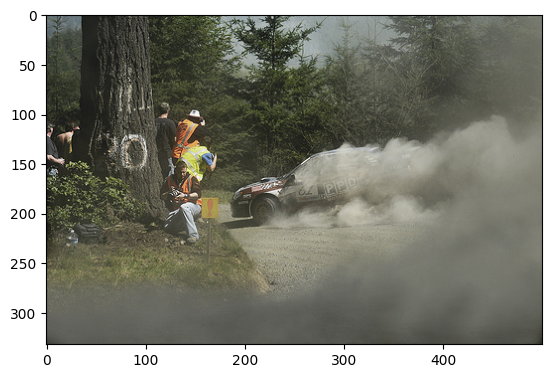

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
3    six men have a band practice in the woods .
Name: query_text, dtype: object


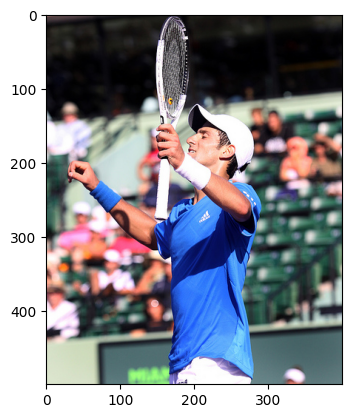

This image is unavailable in your country in compliance with local laws.
5    a snowboarder in a red jacket slides down a sn...
Name: query_text, dtype: object


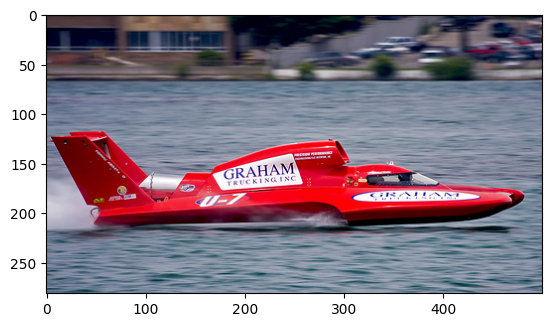

This image is unavailable in your country in compliance with local laws.
7    a man riding a wakeboard on a lake
Name: query_text, dtype: object


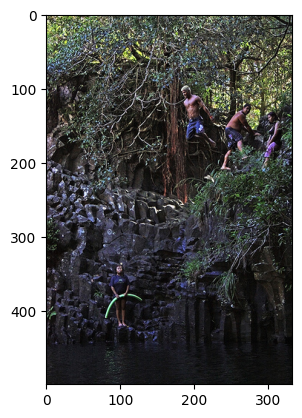

8    a woman sitting at a sewing machine looks up .
Name: query_text, dtype: object


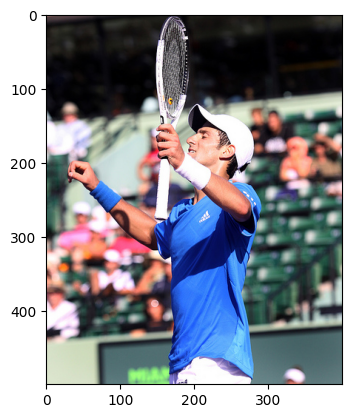

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
11    man wearing hat and t-shirt with " genetic fre...
Name: query_text, dtype: object


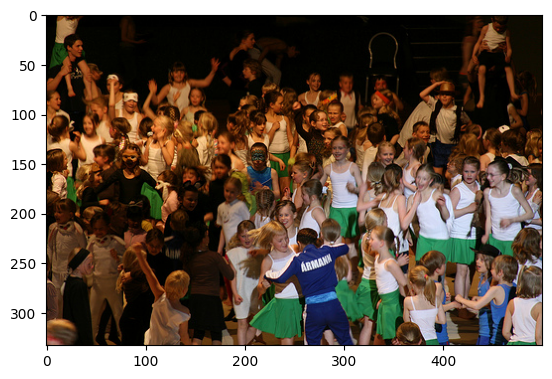

This image is unavailable in your country in compliance with local laws.
13    two women on a movie set reviewing film
Name: query_text, dtype: object


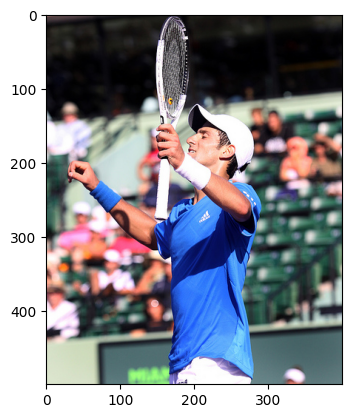

14    several dogs are running down a cement and dir...
Name: query_text, dtype: object


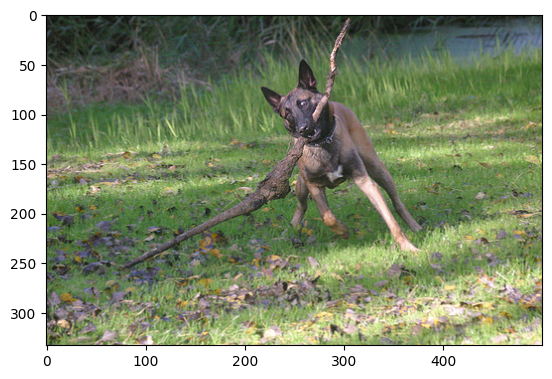

15    two small white dogs chasing a red ball
Name: query_text, dtype: object


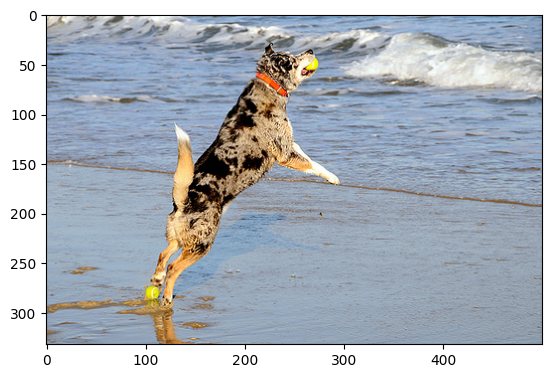

16    a man on a waterski is performing a jump in th...
Name: query_text, dtype: object


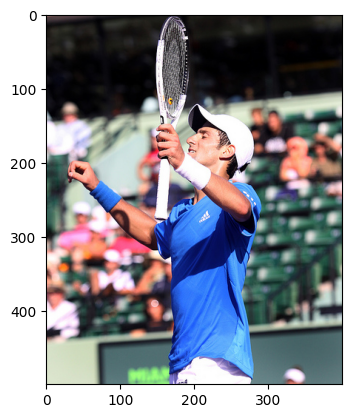

17    a tan dog runs through the brush .
Name: query_text, dtype: object


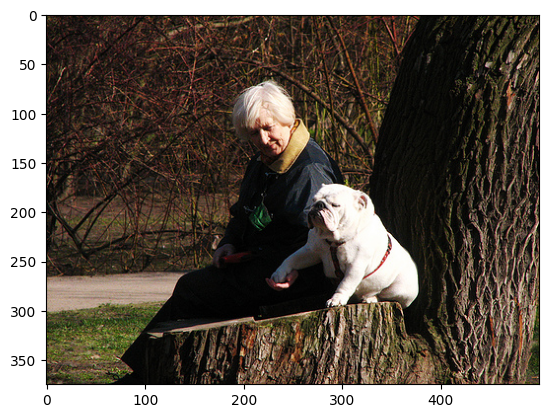

18    a skateboarder jumping on a graffiti covered r...
Name: query_text, dtype: object


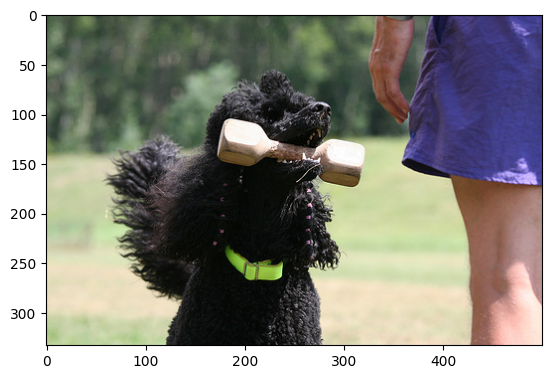

This image is unavailable in your country in compliance with local laws.


In [76]:
for i in range(len(txt_full)):
    x = txt_full.iloc[i:i+1, :]
    checking(x,img)

Функции написаны и со своей задачей справляются. Принимают на вход текст и находят изображение. Отрабатывают контроль "запрещенного контента". В большинстве ситуаций модель угадывает какие-то элементы. Четко отделяет людей от собак, видно что  она также угадыает такие сущности как снег, вода и т.д.

Вывод: для обучения моделей нужен более качественный датасет. Напомним что как эксперты, так и краудсорсеры оценили большинство картинок низко по соответствию описанию

## Вывод
В ходе проекта проделана следующая работа:
1. Проведен исследовательский анализ данных. Основной вывод - большинство картинок согласно как мнению экспертов, так и краудсорсинга - не соответствуют описанию
2. Отфильтрованы детские фотографии на основе описаний. У метода есть погрешность, так как очень часто картинки плохо соответствуют описанию
3. Оценки экспертов и краудсорсинга объединены в шкале от 0 до 1. Изображения и текст векторизированы. Таким образом получен датасет, где целевая переменная - агрегированная оценка экспертов и краудсорсинга, а признаки - объединенный вектор изображений и текстовых описаний.
4. Далее для того чтобы смоделировать вероятность соответствия текстового описания и картинки, мы протестировали алгоритмы: LinearRegression, CatBoostRegressor, RandomForestRegressor  и полносвязную нейросеть Keras. Линейная регрессия сработала хуже всех, а Catboost и Keras дали примерно одинаковый результат: метрика RMSE чуть лучше у нейросети.
5. Далее модель была проверена на тестовой выборке. Нельзя утверждать, что изображения полностью не соответствуют описанию: в них действительно присутствуют элементы, связанные с отдельными словами или сюжетами. Однако степень их соответствия в представленном наборе  низка.